In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
import umap
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
import warnings; warnings.simplefilter('ignore')

In [4]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir
from avgn.signalprocessing.create_spectrogram_dataset import flatten_spectrograms
from avgn.visualization.spectrogram import draw_spec_set

### Collect data

In [5]:
DATASET_ID = 'katahira_white_munia_segmented'

In [6]:
from avgn.visualization.projections import (
    scatter_projections,
    draw_projection_transitions,
)

In [7]:
df_loc =  DATA_DIR / 'syllable_dfs' / DATASET_ID / 'munia.pickle'
df_loc

PosixPath('/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/syllable_dfs/katahira_white_munia_segmented/munia.pickle')

In [10]:
syllable_df = pd.read_pickle(df_loc)

In [11]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,audio,rate,spectrogram
0,1.17,1.182,WM24,0,WM24_11,"[-0.04728996297326066, -0.08354714715479003, -...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
1,1.19,1.200,WM24,0,WM24_11,"[-0.284243243299063, -0.23782483565968338, -0....",48000,"[[0, 0, 0, 0, 0, 0, 0, 19, 9, 2, 0, 0, 3, 5, 0..."
2,1.77,1.802,WM24,0,WM24_11,"[0.37414467401997475, 0.05945352182547608, -0....",48000,"[[0, 0, 0, 0, 0, 0, 7, 7, 0, 0, 0, 0, 0, 0, 0,..."


In [12]:
len(syllable_df)

111500

Text(0.5, 1.0, 'min')

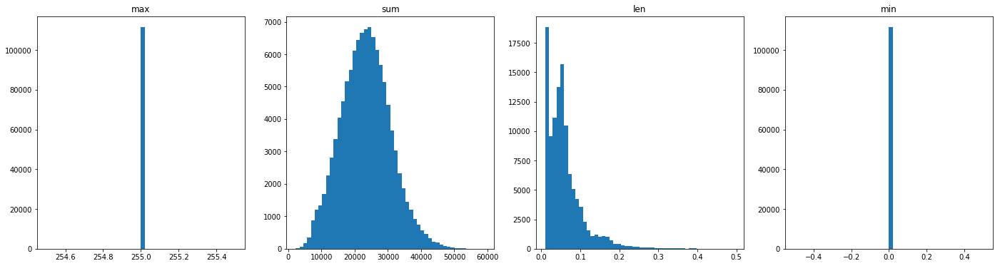

In [13]:
fig, axs = plt.subplots(ncols=4, figsize=(24,6))
axs[0].hist([np.max(i) for i in syllable_df.spectrogram.values], bins=50);axs[0].set_title('max')
axs[1].hist([np.sum(i) for i in syllable_df.spectrogram.values], bins=50);axs[1].set_title('sum')
axs[2].hist((syllable_df.end_time - syllable_df.start_time).values, bins = 50); axs[2].set_title('len')
axs[3].hist([np.min(i) for i in syllable_df.spectrogram.values], bins=50);axs[3].set_title('min')

### cluster

In [14]:
len(syllable_df)

111500

In [15]:
specs = list(syllable_df.spectrogram.values)
specs = [i / np.max(i) for i in specs]
specs_flattened = flatten_spectrograms(specs)
np.shape(specs_flattened)

(111500, 704)

(25.0, 10) (320, 800) 25.0 32 800


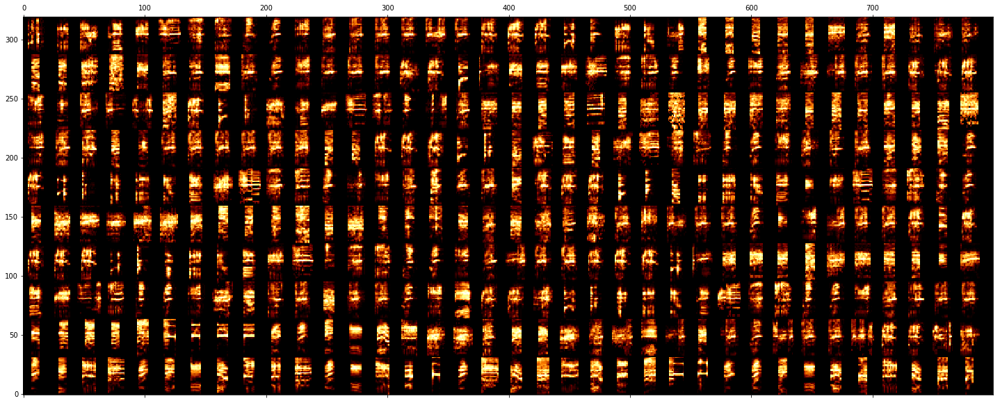

In [16]:
draw_spec_set(specs, zoom=1, maxrows=10, colsize=25)

### variation across individuals

In [ ]:
syllable_df.indv.unique()

array(['WM24', 'WM33', 'WM19', 'WM27', 'WM25', 'WM44', 'WM31', 'WM06',
       'WM37', 'WM30', 'WM26', 'WM10', 'WM36', 'WM03', 'WM15', 'WM28',
       'WM32', 'WM39', 'WM04', 'WM29', 'WM34', 'WM12', 'WM09', 'WM35',
       'WM38', 'WM23', 'WM14', 'WM42', 'WM02', 'WM07', 'WM21', 'WM16',
       'WM40', 'WM18', 'WM43', 'WM22', 'WM41', 'WM01', 'WM17', 'WM20',
       'WM11', 'WM13', 'WM08', 'WM05'], dtype=object)

In [ ]:
from avgn.visualization.quickplots import draw_projection_plots

WM24 147
(25.0, 5) (160, 800) 25.0 32 800


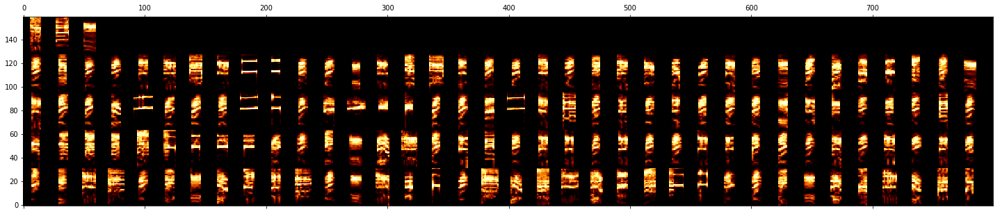

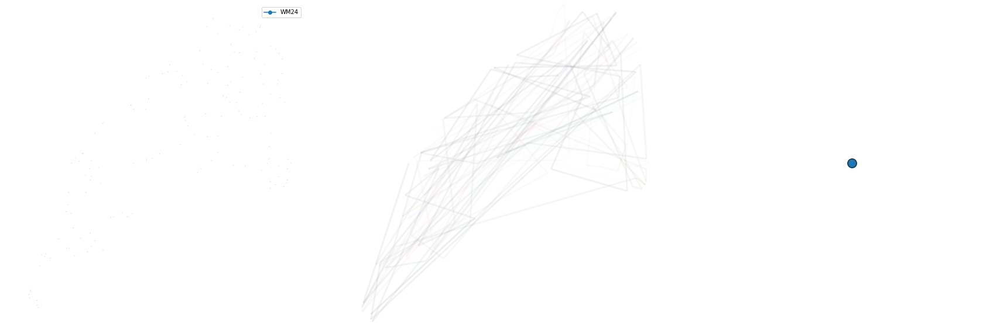

WM33 3308
(25.0, 10) (320, 800) 25.0 32 800


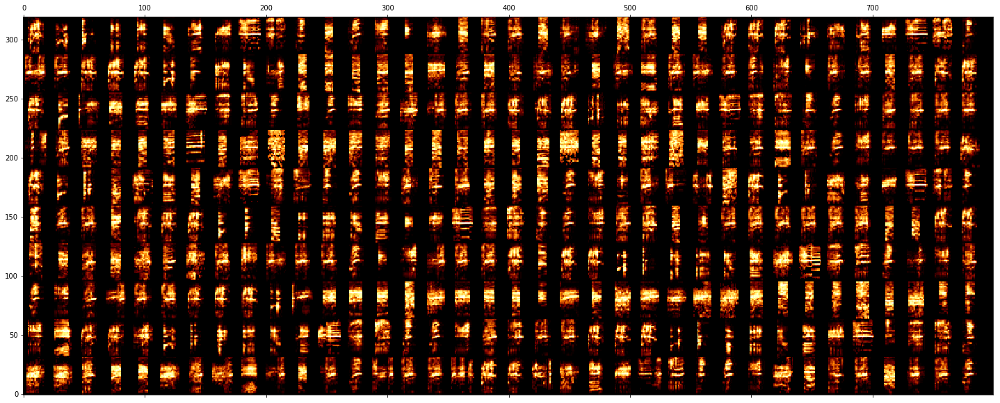

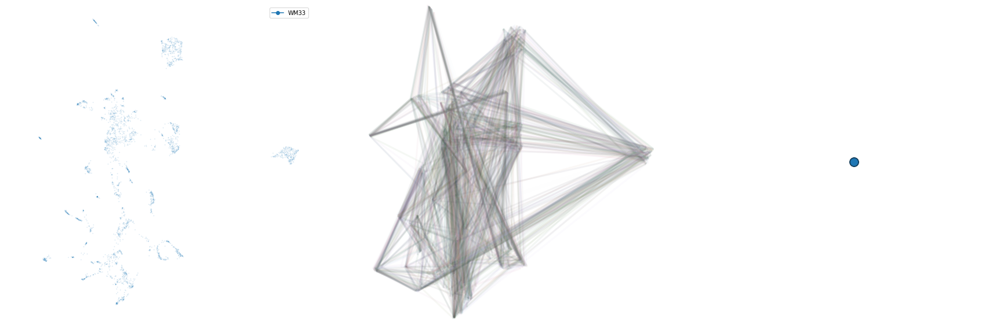

WM19 1285
(25.0, 10) (320, 800) 25.0 32 800


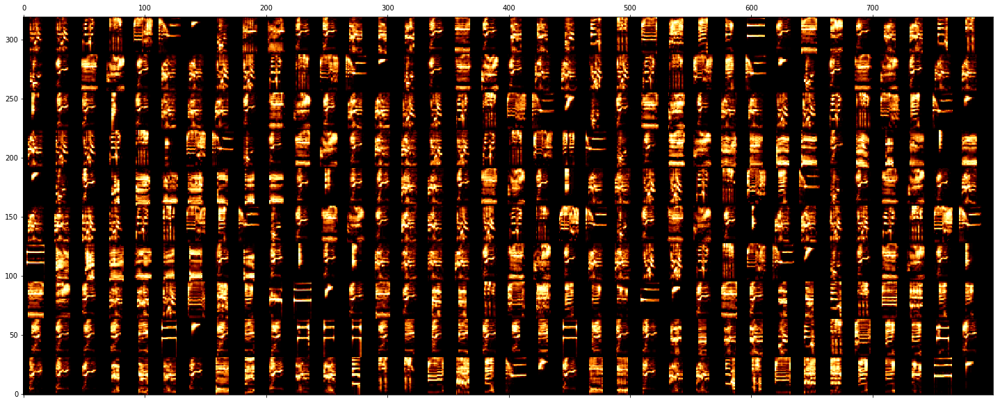

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


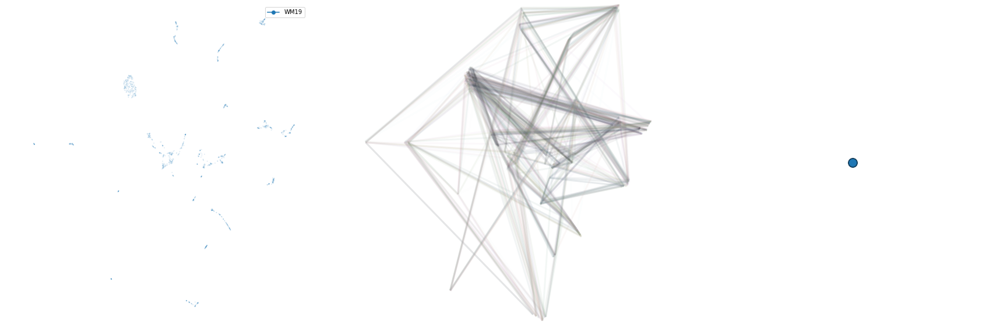

WM27 3734
(25.0, 10) (320, 800) 25.0 32 800


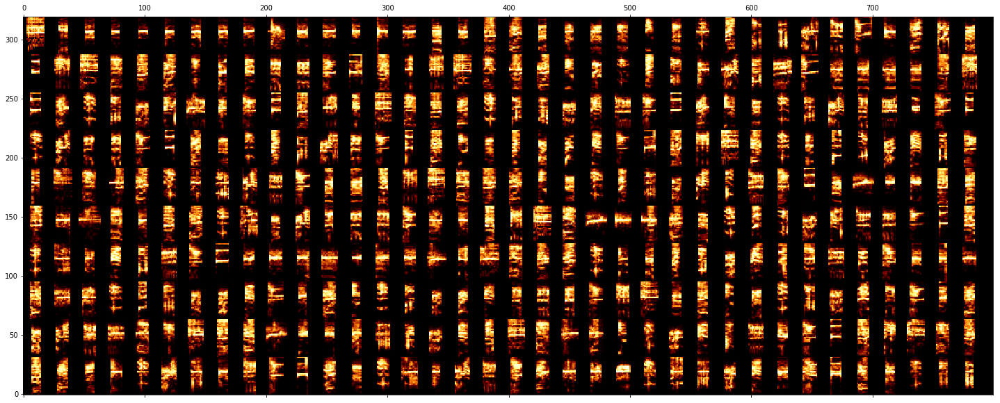

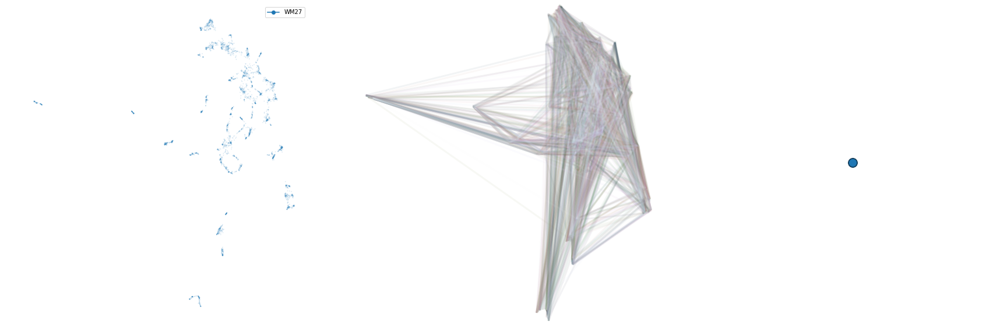

WM25 598
(25.0, 10) (320, 800) 25.0 32 800


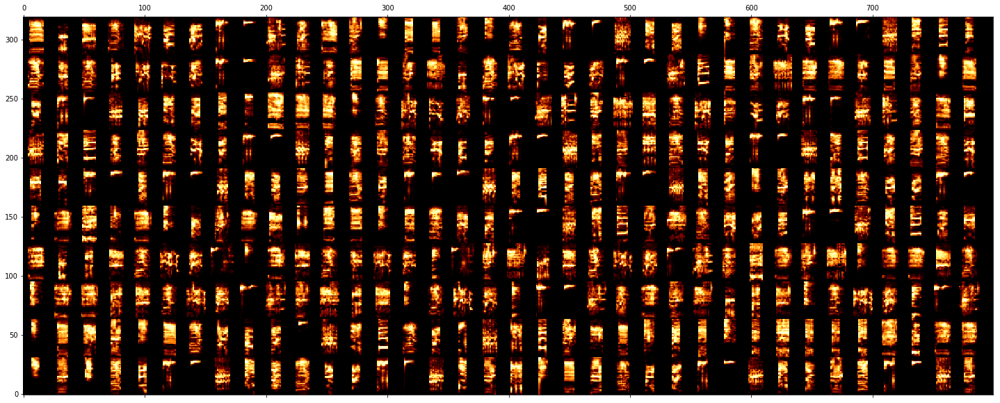

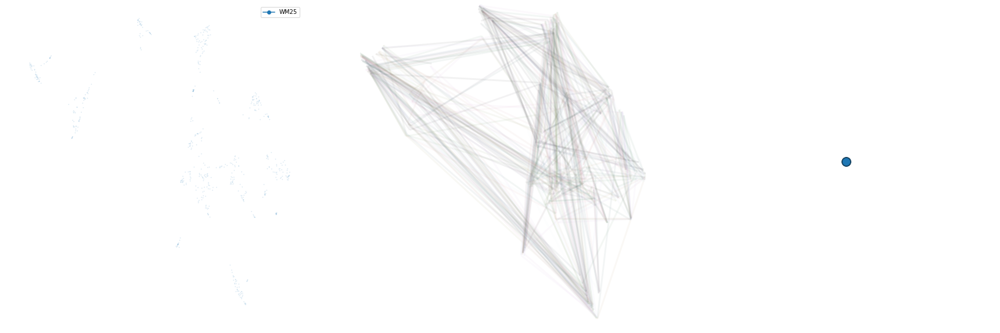

WM44 2889
(25.0, 10) (320, 800) 25.0 32 800


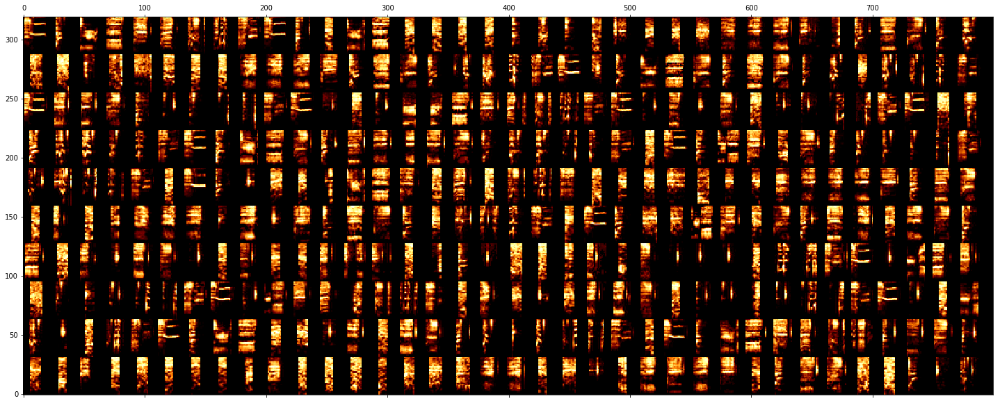

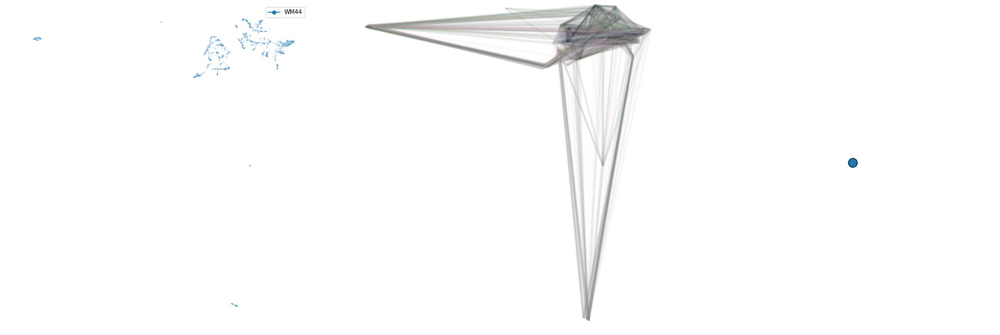

WM31 3468
(25.0, 10) (320, 800) 25.0 32 800


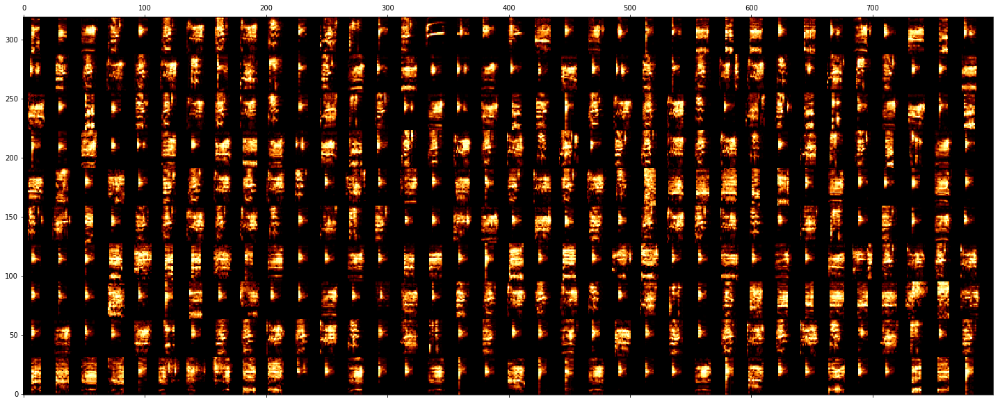

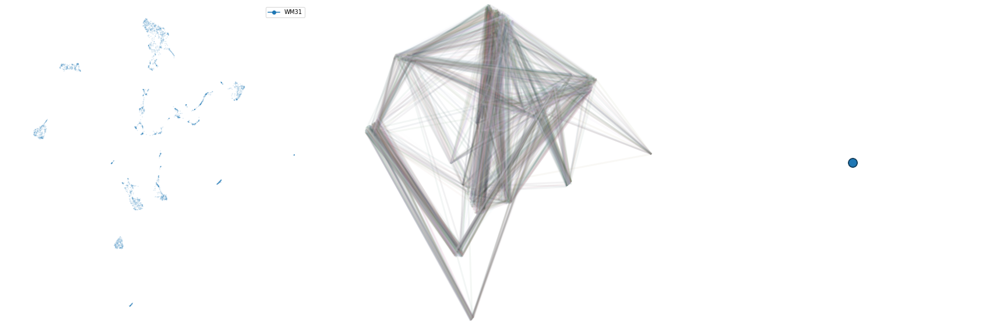

WM06 1669
(25.0, 10) (320, 800) 25.0 32 800


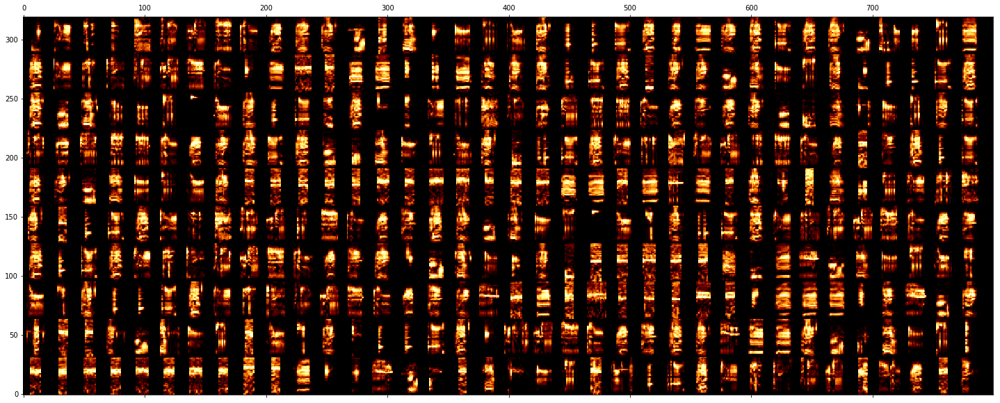

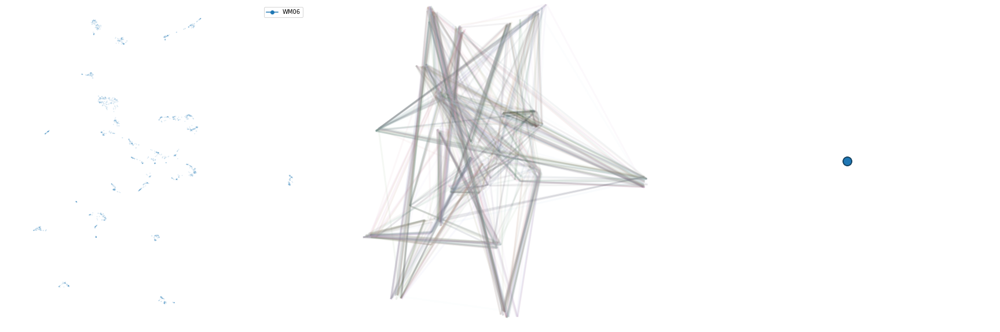

WM37 2214
(25.0, 10) (320, 800) 25.0 32 800


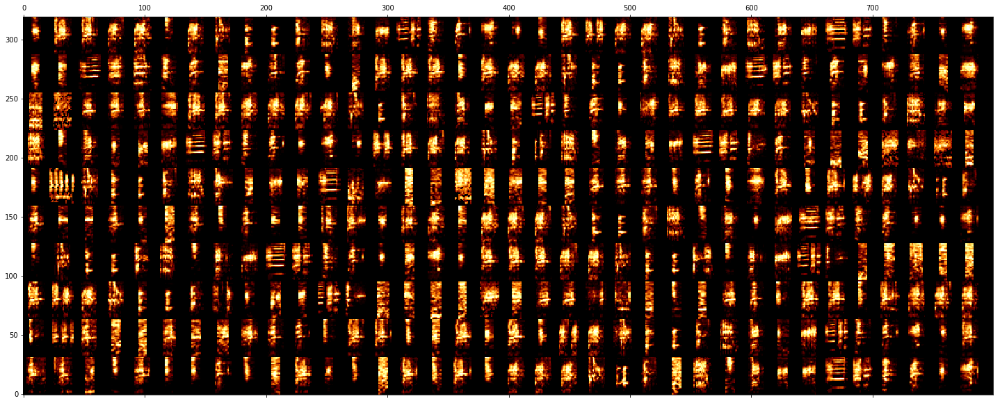

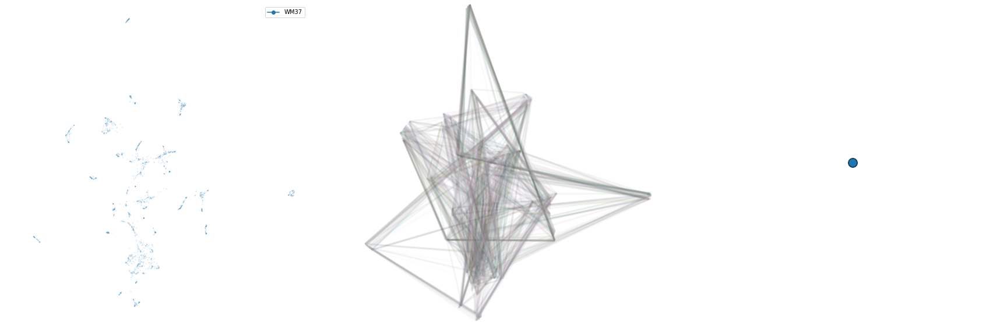

WM30 2077
(25.0, 10) (320, 800) 25.0 32 800


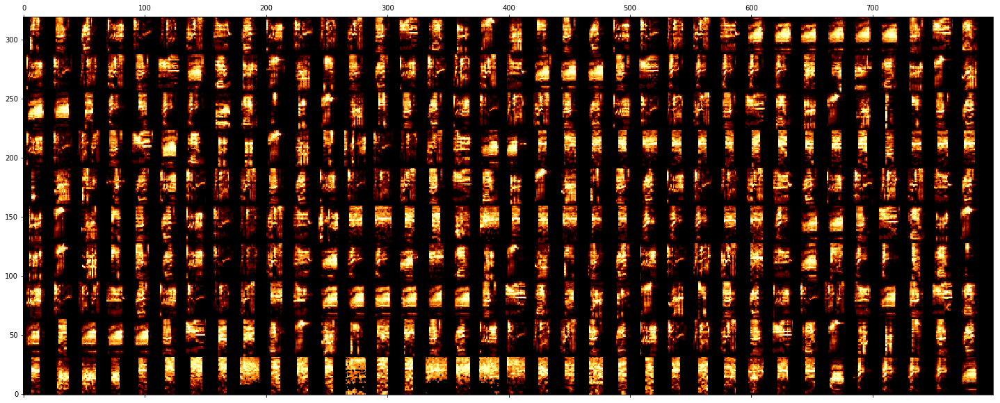

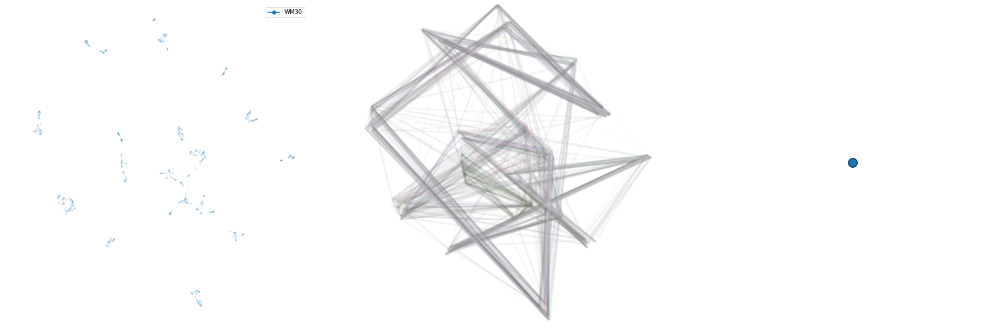

WM26 3551
(25.0, 10) (320, 800) 25.0 32 800


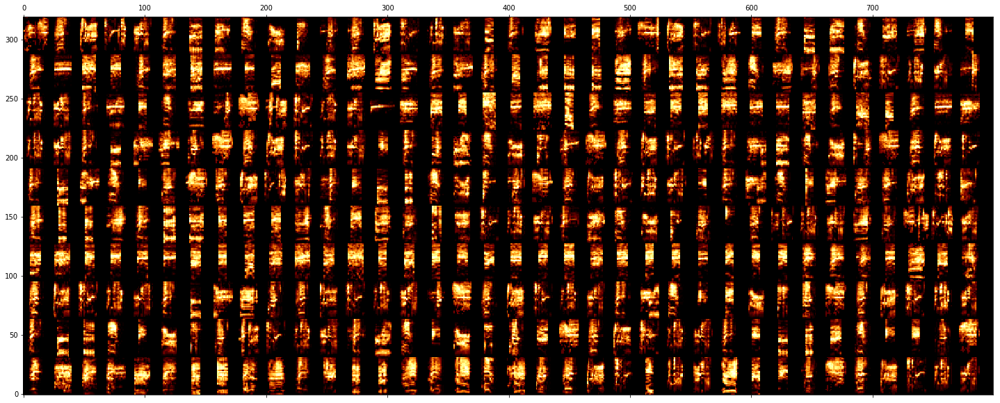

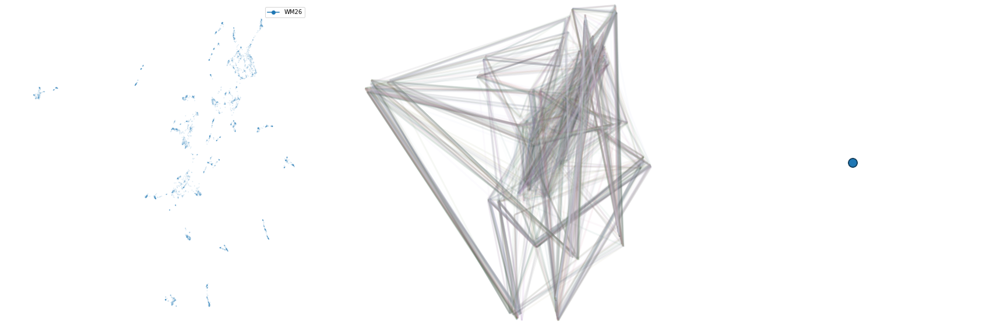

WM10 2068
(25.0, 10) (320, 800) 25.0 32 800


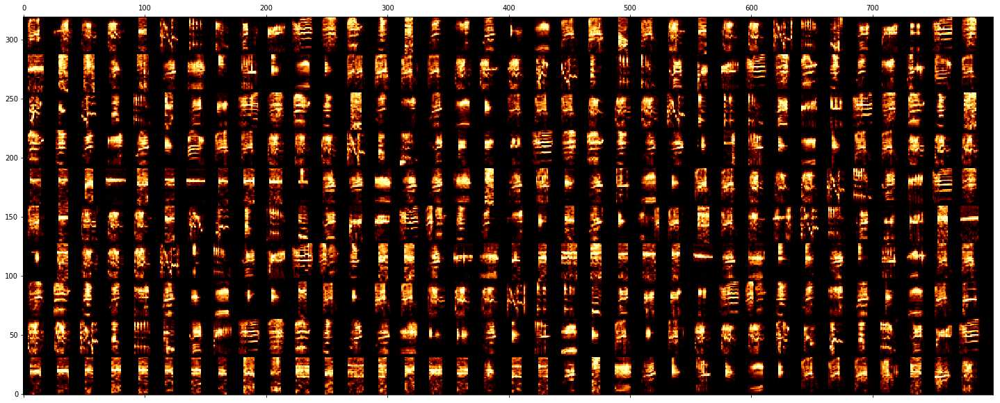

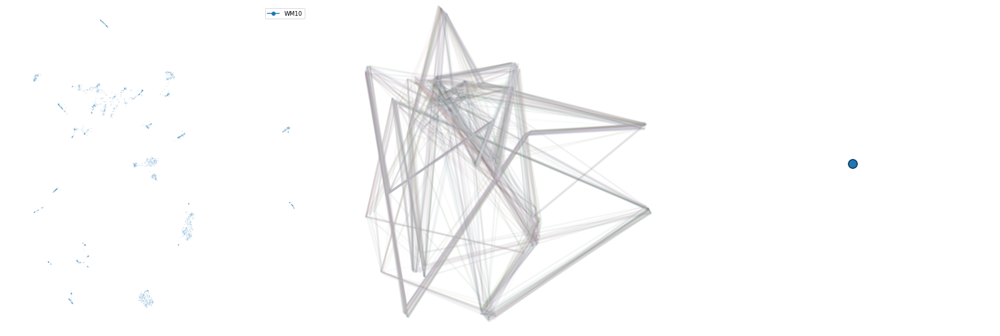

WM36 5117
(25.0, 10) (320, 800) 25.0 32 800


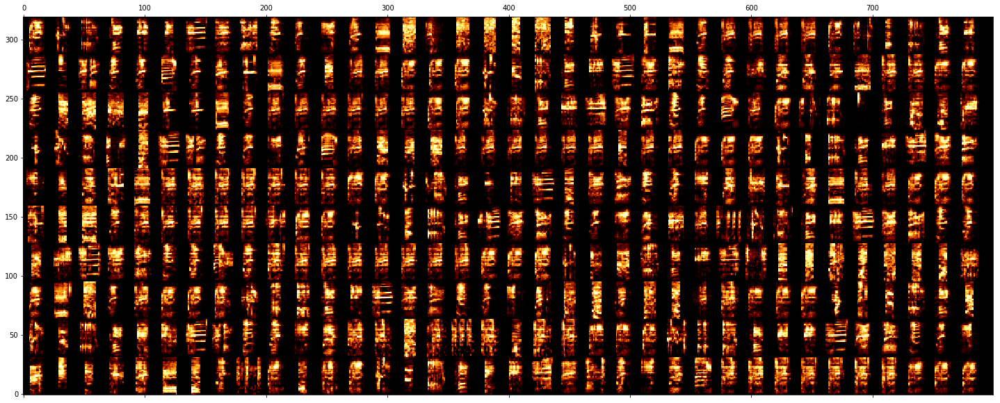

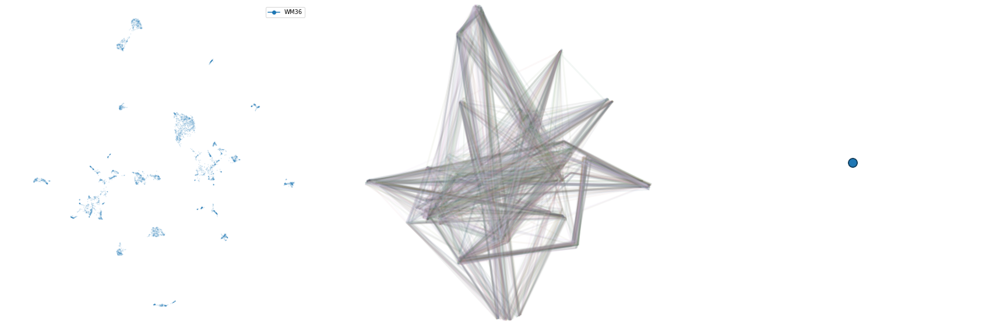

WM03 2446
(25.0, 10) (320, 800) 25.0 32 800


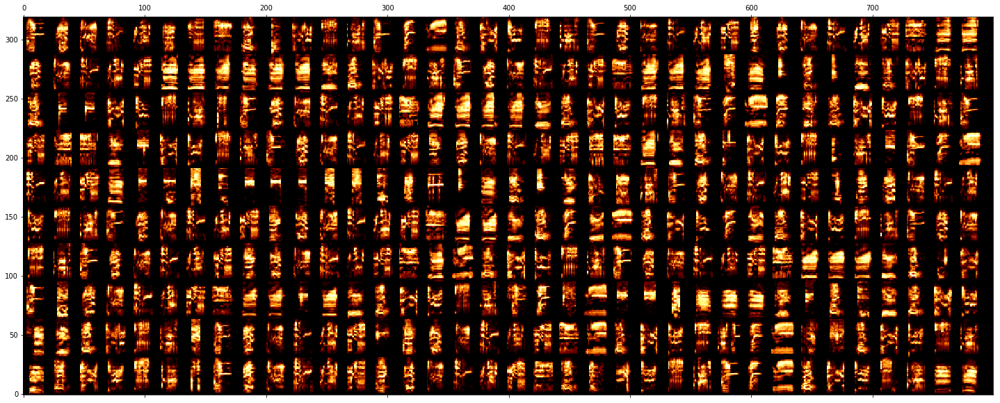

In [ ]:
for indv in tqdm(syllable_df.indv.unique()):
    indv_df = syllable_df[syllable_df.indv == indv]
    print(indv, len(indv_df))

    specs = list(indv_df.spectrogram.values)
    draw_spec_set(specs, zoom=1, maxrows=10, colsize=25)
    
    specs_flattened = flatten_spectrograms(specs)

    fit = umap.UMAP()
    z = list(fit.fit_transform(specs_flattened))
    indv_df["umap"] = z

    indv_df["syllables_sequence_id"] = None
    indv_df["syllables_sequence_pos"] = None
    indv_df = indv_df.sort_values(by=["key", "start_time"])
    for ki, key in enumerate(indv_df.key.unique()):
        indv_df.loc[indv_df.key == key, "syllables_sequence_id"] = ki
        indv_df.loc[indv_df.key == key, "syllables_sequence_pos"] = np.arange(
            np.sum(indv_df.key == key)
        )

    draw_projection_plots(indv_df, label_column="indv")
    plt.show()